#### Data Preprocess

In [1]:
import os
import cv2 as cv
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
import pandas as pd

In [2]:
train_data = '../../Data/test/'
val_data = '../../Data/validation/'

### load_img
#### Description
Loads all `.jpg` images from the specified directory, resizes them to 224x224 pixels, and calculates the scaling ratios for resizing based on the original image dimensions.

#### Parameters
- **im_path** : `str`  
  Path to the directory containing `.jpg` images.

#### Returns
- **tuple**  
  - **images** : `np.ndarray`  
    Array of preprocessed images, resized to (224, 224) and normalized.
  - **ratio_x** : `np.ndarray`  
    Array of scaling ratios for the x-dimension (width) of each image.
  - **ratio_y** : `np.ndarray`  
    Array of scaling ratios for the y-dimension (height) of each image.

In [3]:
def load_img(im_path):
    images = []
    ratio_x = []
    ratio_y = []
    for img_file in os.listdir(im_path):
        if img_file.endswith('.jpg'):
            path = os.path.join(im_path, img_file)
            im = cv.imread(path)
            O_x , O_y = im.shape[:2]
            ratio_x.append(224 / O_y)
            ratio_y.append(224 / O_x)
            im = cv.cvtColor(im, cv.COLOR_BGR2RGB)
            im = cv.resize(im, (224, 224))
            im = im.reshape(224, 224, 3)
            im = im / 255.0
            images.append(im)
    return np.array(images), np.array(ratio_x), np.array(ratio_y)

In [4]:
train_images, ratio_x_train, ratio_y_train = load_img(train_data)

val_images, ratio_x_val, ratio_y_val = load_img(val_data)

### read_xml_files
#### Description
Reads all `.xml` files from the specified directory, parses bounding box coordinates for objects labeled as 'کل ناحیه پلاک', and extracts them as coordinates.

#### Parameters
- **path** : `str`  
  Path to the directory containing `.xml` files.

#### Returns
- **list of list of lists**  
  - **xml_contents** : `list`  
    A list where each element is a list of bounding box coordinates for each image.  
    Each bounding box is represented as a list in the format `[xmin, ymin, xmax, ymax]`.

In [5]:
def read_xml_files(path):
    xml_contents = []
    
    for filename in os.listdir(path):
        if filename.endswith('.xml'):
            file_path = os.path.join(path, filename)
            tree = ET.parse(file_path)
            root = tree.getroot()
            coords = []

            for obj in root.findall('object'):
                name = obj.find('name').text
                if name == 'کل ناحیه پلاک':
                    bndbox = obj.find('bndbox')
                    xmin = int(bndbox.find('xmin').text)
                    ymin = int(bndbox.find('ymin').text)
                    xmax = int(bndbox.find('xmax').text)
                    ymax = int(bndbox.find('ymax').text)
                    coords.append([xmin, ymin, xmax, ymax])
            
            xml_contents.append(coords)
    return xml_contents

In [6]:
train_xml = read_xml_files(train_data)

val_xml = read_xml_files(val_data)

### select_max_area_bbox
#### Description
Selects the bounding box with the largest area for each item in a list of bounding boxes, keeping only one bounding box per item.

#### Parameters
- **xml_data** : `list of list of lists`  
  List of bounding box data, where each element represents a list of bounding boxes for a single image. Each bounding box is specified as `[xmin, ymin, xmax, ymax]`.

#### Returns
- **np.ndarray**  
  An array where each element is the bounding box with the maximum area for each corresponding item in `xml_data`.

In [7]:
def select_max_area_bbox(xml_data):
    for index, bboxes in enumerate(xml_data):
        max_bbox_idx = 0
        if len(bboxes) != 1:
            max_area = float('-inf')
            for j, bbox in enumerate(bboxes):
                area = (bbox[2] - bbox[0]) * (bbox[3] - bbox[1])
                if area > max_area:
                    max_area = area
                    max_bbox_idx = j
        xml_data[index] = bboxes[max_bbox_idx]
    return np.array(xml_data)


In [8]:
train_xml = select_max_area_bbox(train_xml)
val_xml = select_max_area_bbox(val_xml)

In [9]:
for index_i, i in enumerate(train_xml) :
    i[0] *= ratio_x_train[index_i]
    i[1] *= ratio_y_train[index_i]
    i[2] *= ratio_x_train[index_i]
    i[3] *= ratio_y_train[index_i]

In [10]:
for index_i, i in enumerate(val_xml) :
    i[0] *= ratio_x_val[index_i]
    i[1] *= ratio_y_val[index_i]
    i[2] *= ratio_x_val[index_i]
    i[3] *= ratio_y_val[index_i]

#### Model Training

In [11]:
def mean_average_precision(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    
    intersect_mins = tf.maximum(y_true[..., :2], y_pred[..., :2])
    intersect_maxs = tf.minimum(y_true[..., 2:], y_pred[..., 2:])
    intersect_wh = tf.maximum(intersect_maxs - intersect_mins, 0.0)
    intersection = intersect_wh[..., 0] * intersect_wh[..., 1]
    
    true_area = (y_true[..., 2] - y_true[..., 0]) * (y_true[..., 3] - y_true[..., 1])
    pred_area = (y_pred[..., 2] - y_pred[..., 0]) * (y_pred[..., 3] - y_pred[..., 1])
    
    union = true_area + pred_area - intersection
    iou = tf.where(union > 0, intersection / union, tf.zeros_like(intersection))
    
    return tf.reduce_mean(iou)


In [12]:
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=8,
    restore_best_weights=True
)

In [13]:
from tensorflow.keras.callbacks import ReduceLROnPlateau

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)

#### Self Made

In [20]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Input, BatchNormalization, Dropout
from tensorflow.keras.losses import Huber

model = Sequential()

model.add(Input(shape=(224, 224, 3)))

model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(4, activation='linear'))

model.compile(optimizer='adam', loss=Huber(delta=1.0), metrics=['mae', 'accuracy', mean_average_precision])

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 224, 224, 16)   │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 224, 224, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 112, 112, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 54, 54, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 54, 54, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 52, 52, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 52, 52, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 24, 24, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 24, 24, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 22, 22, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 22, 22, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 11, 11, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 15488)          │             

 Total params: 8,227,860 (31.39 MB)

 Trainable params: 8,226,900 (31.38 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
history = model.fit(train_images, train_xml, 
                    validation_data=(val_images, val_xml), 
                    epochs=100, 
                    batch_size=32, 
                    callbacks=[lr_reducer, early_stopping])

Epoch 1/100
105/105 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.6421 - loss: 36.8159 - mae: 37.3123 - mean_average_precision: 0.0269 - val_accuracy: 0.6850 - val_loss: 49.9008 - val_mae: 50.3986 - val_mean_average_precision: 5.8103e-04 - learning_rate: 0.0010
Epoch 2/100
105/105 ━━━━━━━━━━━━━━━━━━━━ 112s 1s/step - accuracy: 0.7619 - loss: 25.3645 - mae: 25.8597 - mean_average_precision: 0.0507 - val_accuracy: 0.6850 - val_loss: 36.8322 - val_mae: 37.3291 - val_mean_average_precision: 0.0121 - learning_rate: 0.0010
Epoch 3/100
105/105 ━━━━━━━━━━━━━━━━━━━━ 107s 1s/step - accuracy: 0.7732 - loss: 23.5843 - mae: 24.0795 - mean_average_precision: 0.0634 - val_accuracy: 0.6938 - val_loss: 31.3582 - val_mae: 31.8550 - val_mean_average_precision: 0.0417 - learning_rate: 0.0010
Epoch 4/100
105/105 ━━━━━━━━━━━━━━━━━━━━ 106s 1s/step - accuracy: 0.8108 - loss: 21.7949 - mae: 22.2893 - mean_average_precision: 0.0731 - val_accuracy: 0.8044 - val_loss: 22.4054 - val_mae: 22.9006 - val_mean_averag

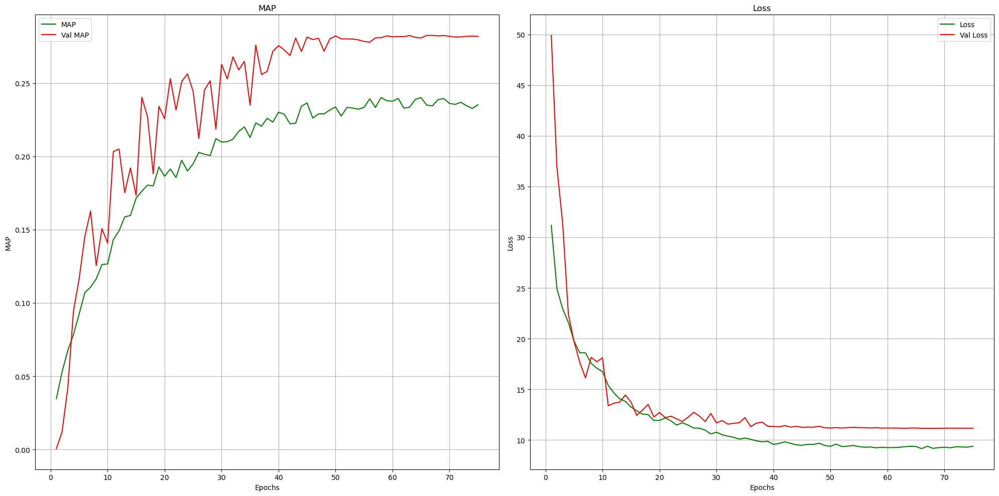

In [30]:
MAP = history.history['mean_average_precision']
loss = history.history['loss']
val_MAP = history.history['val_mean_average_precision']
val_loss = history.history['val_loss']

epochs = [i + 1 for i in range(len(MAP))]
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.plot(epochs, MAP, 'g', label='MAP')
plt.plot(epochs, val_MAP, 'r', label='Val MAP')
plt.title('MAP')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('MAP')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'g', label='Loss')
plt.plot(epochs, val_loss, 'r', label='Val Loss')
plt.title('Loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)

plt.tight_layout()
plt.show()

In [25]:
model.save('self_90per.keras')

#### MobileNet

In [16]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.layers import Dense, Flatten, Input, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.losses import Huber

base_model = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

base_model.trainable = False
for layer in base_model.layers[-35:]:
    layer.trainable = True

inputs = Input(shape=(224, 224, 3))

x = base_model(inputs, training=False)
x = Flatten()(x)

x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
outputs = Dense(4, activation='linear')(x)

model2 = Model(inputs, outputs)

model2.compile(optimizer='adam', loss=Huber(delta=1.0), metrics=['mae', 'accuracy', mean_average_precision])


model2.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 7, 7, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1024)           │    51,381,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │         4,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 54,614,212 (208.34 MB)

 Trainable params: 54,048,772 (206.18 MB)

 Non-trainable params: 565,440 (2.16 MB)

In [17]:
history2 = model2.fit(
    train_images, train_xml, batch_size=32,
    validation_data=(val_images, val_xml),
    epochs=100,
    callbacks=[lr_reducer, early_stopping]
)


Epoch 1/100
105/105 ━━━━━━━━━━━━━━━━━━━━ 125s 1s/step - accuracy: 0.6620 - loss: 38.1756 - mae: 38.6717 - mean_average_precision: 0.0448 - val_accuracy: 0.8407 - val_loss: 199.6514 - val_mae: 200.1514 - val_mean_average_precision: 0.0000e+00 - learning_rate: 0.0010
Epoch 2/100
105/105 ━━━━━━━━━━━━━━━━━━━━ 111s 1s/step - accuracy: 0.8668 - loss: 18.5004 - mae: 18.9941 - mean_average_precision: 0.0978 - val_accuracy: 0.9139 - val_loss: 74.9506 - val_mae: 75.4505 - val_mean_average_precision: 3.1451e-04 - learning_rate: 0.0010
Epoch 3/100
105/105 ━━━━━━━━━━━━━━━━━━━━ 110s 1s/step - accuracy: 0.8918 - loss: 15.6982 - mae: 16.1904 - mean_average_precision: 0.1403 - val_accuracy: 0.9315 - val_loss: 46.2746 - val_mae: 46.7744 - val_mean_average_precision: 0.0075 - learning_rate: 0.0010
Epoch 4/100
105/105 ━━━━━━━━━━━━━━━━━━━━ 110s 1s/step - accuracy: 0.9068 - loss: 13.3907 - mae: 13.8819 - mean_average_precision: 0.1599 - val_accuracy: 0.9327 - val_loss: 30.4026 - val_mae: 30.9020 - val_mean_

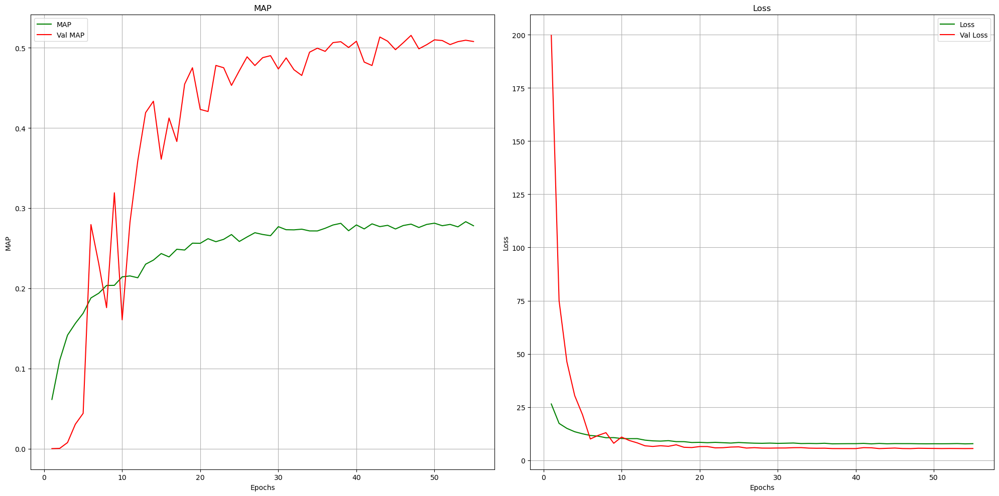

In [18]:
MAP = history2.history['mean_average_precision']
loss = history2.history['loss']
val_MAP = history2.history['val_mean_average_precision']
val_loss = history2.history['val_loss']

epochs = [i + 1 for i in range(len(MAP))]
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.plot(epochs, MAP, 'g', label='MAP')
plt.plot(epochs, val_MAP, 'r', label='Val MAP')
plt.title('MAP')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('MAP')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'g', label='Loss')
plt.plot(epochs, val_loss, 'r', label='Val Loss')
plt.title('Loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)

plt.tight_layout()
plt.show()

In [19]:
model2.save('Mobilenet_94_V2_35layer.keras')

#### MobileNetV2

In [16]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, Flatten, Input, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.losses import Huber

base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

base_model.trainable = False
for layer in base_model.layers[-50:]:
    layer.trainable = True

inputs = Input(shape=(224, 224, 3))
x = base_model(inputs, training=False)
x = Flatten()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
outputs = Dense(4, activation='linear')(x)

model3 = Model(inputs, outputs)

model3.compile(optimizer='adam', loss=Huber(delta=1.0), metrics=['mae', 'accuracy', mean_average_precision])


model3.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 62720)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1024)           │    64,226,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │         4,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 66,488,388 (253.63 MB)

 Trainable params: 66,085,508 (252.10 MB)

 Non-trainable params: 402,880 (1.54 MB)

i try to do the process again but its takes too much time
- i put the last 10 result in markdown

In [17]:
history3 = model3.fit(
    train_images, train_xml, batch_size=32,
    validation_data=(val_images, val_xml),
    epochs=100,
    callbacks=[lr_reducer, early_stopping]
)

KeyboardInterrupt: 

```plaintext
Epoch  | Accuracy | Loss  | MAE   | mAP    | Val_Accuracy | Val_Loss | Val_MAE | Val_mAP | Learning_Rate
----------------------------------------------------------------------------------------------
69/100 | 0.9628   | 6.7558| 7.2380| 0.3142 | 0.9537       | 4.7268   | 5.1831  | 0.5486  | 1.5625e-05
70/100 | 0.9638   | 6.6712| 7.1547| 0.3199 | 0.9567       | 4.6587   | 5.1143  | 0.5499  | 1.5625e-05
71/100 | 0.9598   | 6.6173| 7.0993| 0.3189 | 0.9567       | 4.5755   | 5.0305  | 0.5572  | 1.5625e-05
72/100 | 0.9642   | 6.6681| 7.1503| 0.3168 | 0.9561       | 4.5884   | 5.0431  | 0.5574  | 1.5625e-05
73/100 | 0.9620   | 6.5974| 7.0787| 0.3223 | 0.9561       | 4.5853   | 5.0395  | 0.5577  | 1.5625e-05
74/100 | 0.9653   | 6.6284| 7.1119| 0.3244 | 0.9567       | 4.7159   | 5.1755  | 0.5431  | 1.5625e-05
75/100 | 0.9641   | 6.6008| 7.0831| 0.3189 | 0.9561       | 4.6092   | 5.0651  | 0.5552  | 7.8125e-06
76/100 | 0.9633   | 6.5135| 6.9949| 0.3283 | 0.9555       | 4.6391   | 5.0947  | 0.5520  | 7.8125e-06
77/100 | 0.9577   | 6.7582| 7.2401| 0.3149 | 0.9555       | 4.5801   | 5.0326  | 0.5599  | 7.8125e-06
78/100 | 0.9600   | 6.6420| 7.1241| 0.3103 | 0.9549       | 4.5951   | 5.0502  | 0.5586  | 3.9063e-06
79/100 | 0.9616   | 6.6538| 7.1354| 0.3191 | 0.9561       | 4.6019   | 5.0575  | 0.5586  | 3.9063e-06


In [ ]:
model3.save('MobileNetV2_95_50layer.keras')

#### Some predictions on the validation data

In [ ]:
def predict_image(image, model_predict) : 
    x = model_predict.predict(image.reshape(1, 224, 224, 3))
    x = x[0]
    x = [round(i) for i in x]
    image_copy = image.copy() 
    return cv.rectangle(image_copy, (x[0], x[1]), (x[2], x[3]), (0, 255, 0), 2)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


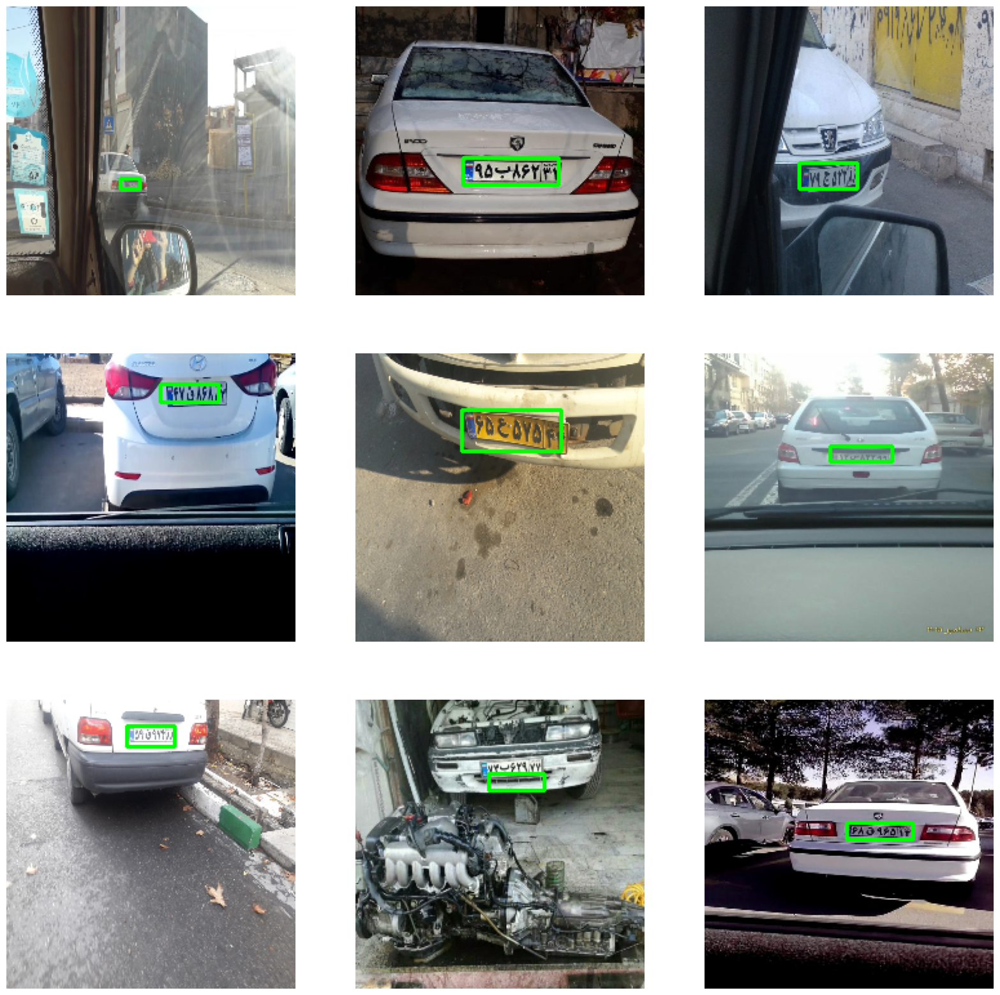

In [ ]:
plt.figure(figsize=(20, 20))
for i, index in enumerate(numbers):
    plt.subplot(3, 3, i+1)
    predicted_image = predict_image(val_images[index], model2)
    plt.imshow(predicted_image)
    plt.axis('off')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


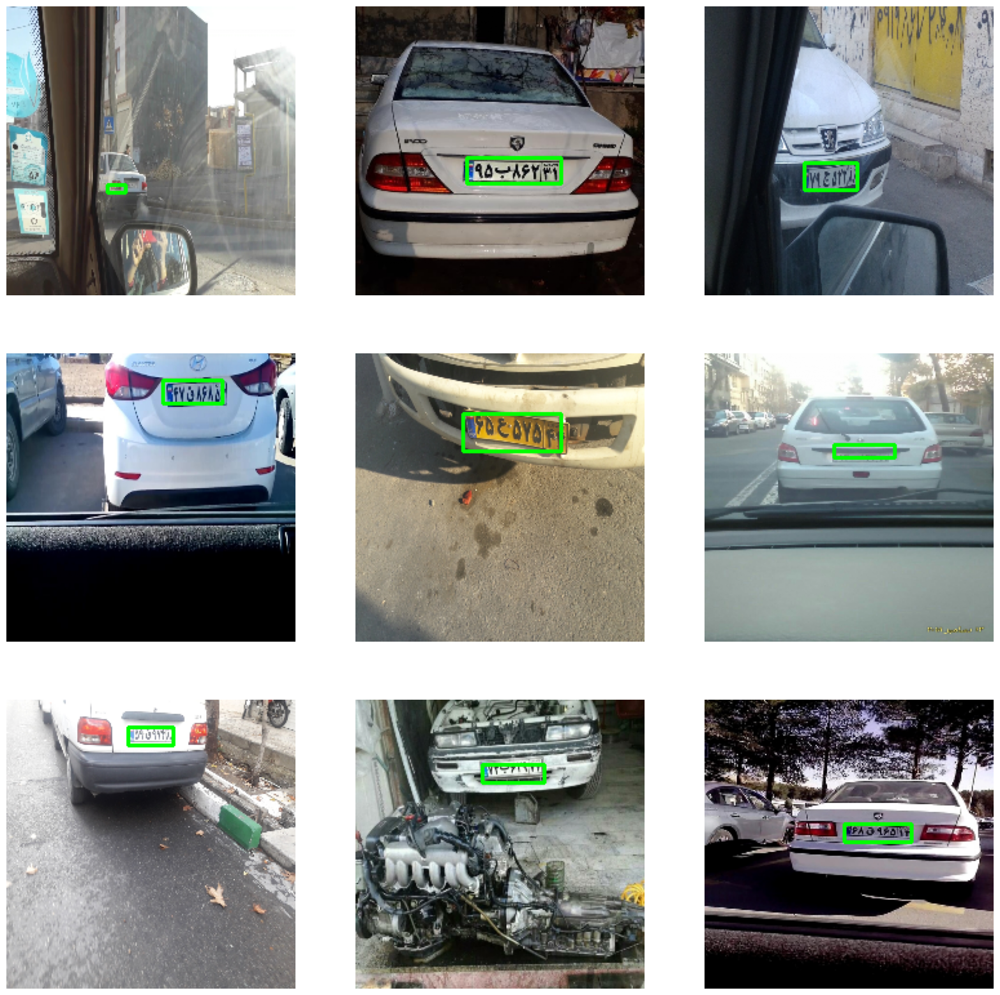

In [ ]:
plt.figure(figsize=(20, 20))
for i, index in enumerate(numbers):
    plt.subplot(3, 3, i+1)
    predicted_image = predict_image(val_images[index], model3)
    plt.imshow(predicted_image)
    plt.axis('off')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


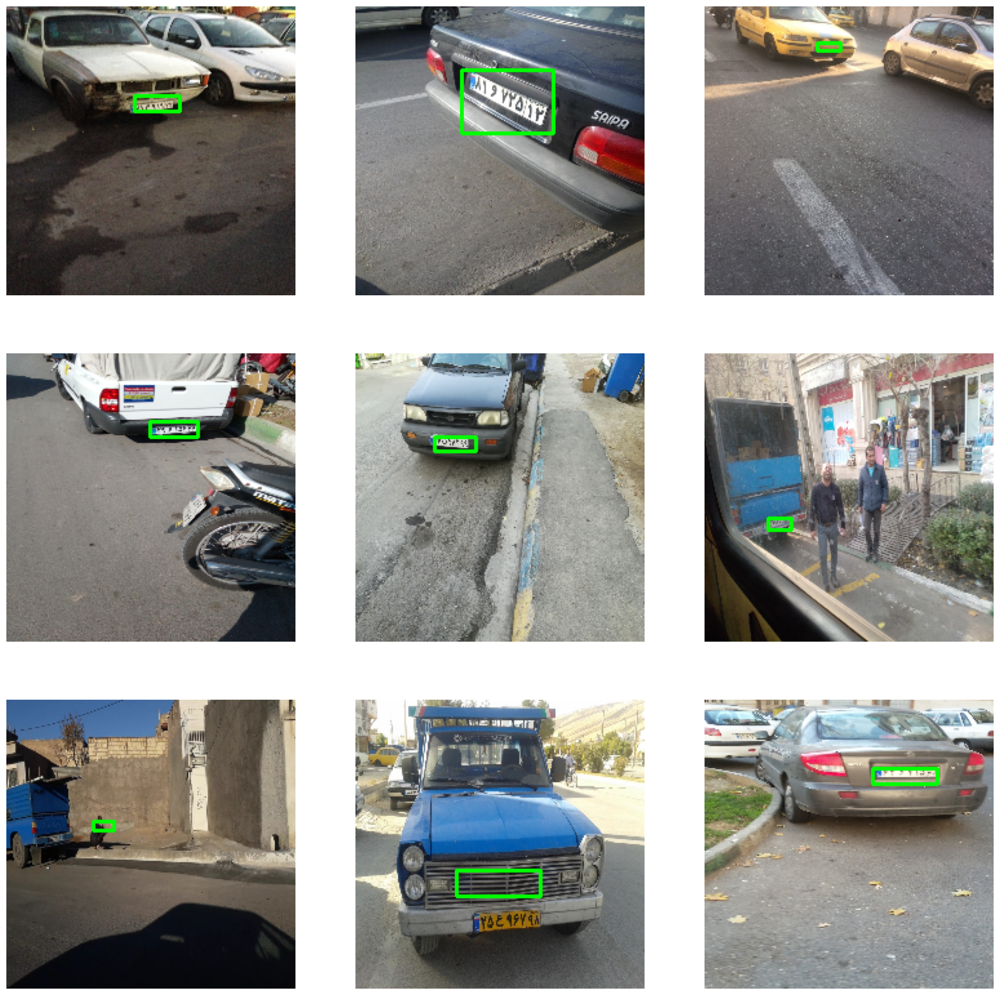

In [ ]:
plt.figure(figsize=(20, 20))
for i, index in enumerate(numbers):
    plt.subplot(3, 3, i+1)
    predicted_image = predict_image(val_images[index], model2)
    plt.imshow(predicted_image)
    plt.axis('off')

In [ ]:
from tensorflow.keras.models import load_model

model3 = load_model("MobileNetV2_95_50layer.keras", custom_objects={"mean_average_precision": mean_average_precision}) 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


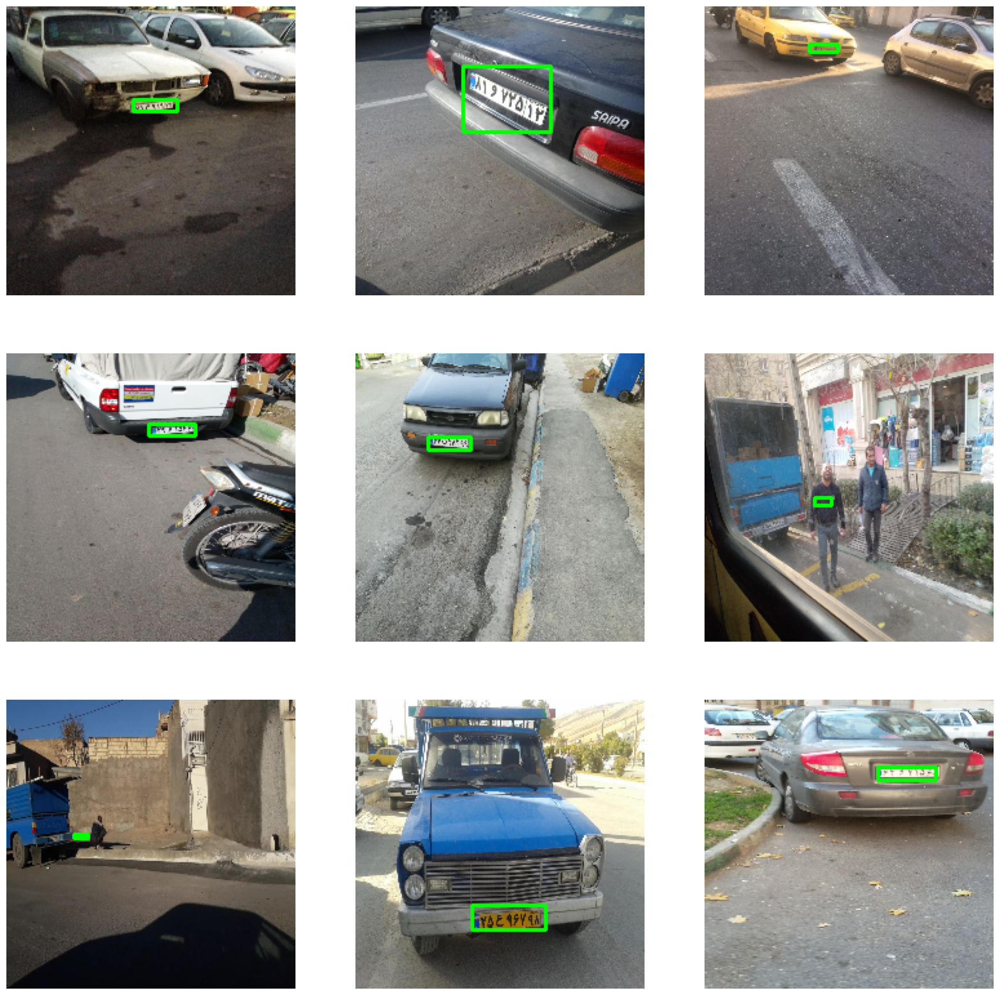

In [ ]:
plt.figure(figsize=(20, 20))
for i, index in enumerate(numbers):
    plt.subplot(3, 3, i+1)
    predicted_image = predict_image(val_images[index], model3)
    plt.imshow(predicted_image)
    plt.axis('off')

#### Results

In [ ]:
results = {
    'MobileNet' : {'90', '93', '93_30layer', '93', '94_25layer', '94_30layer'},
    'MobileNetV2' : {'95_25layer', '95_50layer'},
    'self_made' : {'85' , '86', '88', '91'}
}

dict_keys(['MobileNet', 'MobileNetV2', 'self_made'])

In [ ]:
file_series = pd.DataFrame(results.values(), results.keys())
file_series

,0,1,2,3,4
MobileNet,94_25layer,93_30layer,93,94_30layer,90
MobileNetV2,95_25layer,95_50layer,None,None,None
self_made,86,88,91,85,None
